# Imports

In [3]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
from time import time
import tracemalloc

import pandas as pd
import numpy as np
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import seaborn as sns
import optuna
import folium

from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

from xgboost import XGBRegressor

from geopy.distance import geodesic

# Carregando os Dados

In [5]:
# Carregar os dados
bts_df = pd.read_csv('Data/Bts.csv')
meds_df = pd.read_csv('Data/meds_train_alunos.csv')

# Análise dos Datasets

In [6]:
print(f"---------------------------BTS.csv---------------------------\n\
Quantidade de dados: {bts_df.shape[0]}\n\
Colunas do dataset: {list(bts_df.columns)}")

---------------------------BTS.csv---------------------------
Quantidade de dados: 9
Colunas do dataset: ['grupo', 'btsId', 'btsNetNome', 'lat', 'lon', 'cch', 'azimuth', 'RssiId']


In [7]:
# Visualizar os dados bts
bts_df

,grupo,btsId,btsNetNome,lat,lon,cch,azimuth,RssiId
0,1,BTS_1_1,PEMDL01_1,-8.04342,-34.952000,873,0,rssi_1_1
1,1,BTS_1_2,PEMDL01_2,-8.04342,-34.952000,872,120,rssi_1_2
2,1,BTS_1_3,PEMDL01_3,-8.04342,-34.952000,875,240,rssi_1_3
3,2,BTS_2_1,PEMDL08_1,-8.05289,-34.944672,865,0,rssi_2_1
4,2,BTS_2_2,PEMDL08_2,-8.05289,-34.944672,874,120,rssi_2_2
5,2,BTS_2_3,PEMDL08_3,-8.05289,-34.944672,871,240,rssi_2_3
6,3,BTS_3_1,PEMDL09_1,-8.05532,-34.957900,877,0,rssi_3_1
7,3,BTS_3_2,PEMDL09_2,-8.05532,-34.957900,881,120,rssi_3_2
8,3,BTS_3_3,PEMDL09_3,-8.05532,-34.957900,869,240,rssi_3_3


In [8]:
print(f"---------------------------Meds_train.csv---------------------------\n\
Quantidade de dados: {meds_df.shape[0]}\n\
Colunas do dataset: {list(meds_df.columns)}")

---------------------------Meds_train.csv---------------------------
Quantidade de dados: 6775
Colunas do dataset: ['ponto_id', 'rssi_1_1', 'rssi_1_2', 'rssi_1_3', 'rssi_2_1', 'rssi_2_2', 'rssi_2_3', 'rssi_3_1', 'rssi_3_2', 'rssi_3_3', 'delay_1', 'delay_2', 'delay_3', 'lat', 'lon', 'indoor']


In [9]:
meds_df.head(10)

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon,indoor
0,6604,-103.705000,-110.425000,-107.381667,-110.330000,-108.345000,-106.590000,-107.153333,-102.120000,-115.0000,5.0,3.0,2.0,-8.055786,-34.951505,True
1,5515,-105.225000,-115.000000,-105.210000,-115.000000,-105.835000,-115.000000,-88.470000,-94.024286,-108.1200,5.0,3.0,2.0,-8.055784,-34.951608,True
2,5049,-102.610000,-115.000000,-101.380000,-115.000000,-104.295000,-97.360000,-96.980000,-99.572500,-115.0000,5.0,3.0,2.0,-8.055506,-34.951693,True
3,8737,-89.140000,-97.251429,-86.642857,-96.036667,-96.592500,-92.460000,-86.813333,-102.688000,-87.2700,4.0,7.0,2.0,-8.050390,-34.959630,False
4,1203,-109.088333,-107.200000,-107.010000,-108.430000,-104.845714,-101.435714,-103.065000,-102.110000,-115.0000,5.0,3.0,2.0,-8.055380,-34.951736,True
5,6952,-91.530000,-99.115714,-89.424286,-96.235000,-92.837500,-93.327143,-82.363333,-81.940000,-79.3400,6.0,5.0,0.0,-8.055780,-34.956390,False
6,8875,-80.246429,-98.010714,-81.366667,-99.550000,-97.245000,-93.067143,-71.000000,-99.934667,-95.8475,3.0,4.0,3.0,-8.049710,-34.954640,False
7,1926,-98.748000,-99.670000,-98.610000,-97.860000,-92.837500,-90.747143,-100.030000,-95.250000,-115.0000,5.0,3.0,3.0,-8.055494,-34.951316,True
8,2641,-115.000000,-115.000000,-115.000000,-115.000000,-96.330000,-92.668333,-88.890000,-78.261429,-115.0000,5.0,3.0,3.0,-8.055684,-34.951331,True
9,3399,-100.830000,-115.000000,-98.560000,-115.000000,-100.406667,-97.845714,-99.255000,-104.940000,-115.0000,5.0,3.0,3.0,-8.055834,-34.951362,True


In [10]:
# Análise preliminar dos dados
meds_df.describe()

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon
count,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000
mean,4856.099779,-100.789923,-105.688802,-100.545198,-103.524786,-97.210290,-97.193499,-93.644749,-93.353728,-107.478361,4.679410,3.159262,2.504945,-8.054510,-34.951792
std,2785.645694,10.025728,10.397924,9.968138,13.367328,8.853480,9.992950,7.688089,8.110877,11.003407,0.911469,1.009927,1.095094,0.002388,0.002310
min,1.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-113.140000,-115.630000,-115.000000,1.000000,0.000000,0.000000,-8.059550,-34.959850
25%,2434.500000,-107.650000,-115.000000,-107.148571,-115.000000,-102.202857,-101.652857,-99.480000,-99.005000,-115.000000,5.000000,3.000000,2.000000,-8.055784,-34.951728
50%,4875.000000,-103.040000,-110.425000,-99.750000,-108.430000,-97.170000,-95.615714,-94.785000,-95.688000,-115.000000,5.000000,3.000000,2.000000,-8.055494,-34.951597
75%,7272.500000,-93.455000,-97.350000,-93.340000,-96.817917,-92.080000,-91.951429,-89.375000,-89.610500,-97.600000,5.000000,3.000000,3.000000,-8.055310,-34.951331
max,9676.000000,-61.380000,-64.820000,-60.640000,-36.960000,-59.170000,-56.980000,-56.060000,-55.870000,-52.540000,8.000000,7.000000,7.000000,-8.046420,-34.945110


## Verificando se há Missing Values:

In [11]:
bts_df.isnull().sum()

grupo         0
btsId         0
btsNetNome    0
lat           0
lon           0
cch           0
azimuth       0
RssiId        0
dtype: int64

In [12]:
meds_df.isnull().sum()

ponto_id    0
rssi_1_1    0
rssi_1_2    0
rssi_1_3    0
rssi_2_1    0
rssi_2_2    0
rssi_2_3    0
rssi_3_1    0
rssi_3_2    0
rssi_3_3    0
delay_1     0
delay_2     0
delay_3     0
lat         0
lon         0
indoor      0
dtype: int64

## Verificando se há dados duplicados:

In [13]:
print(f"Quantidade de duplicatas = {meds_df.drop_duplicates(subset=['ponto_id']).shape[0] - meds_df.shape[0]}")

Quantidade de duplicatas = 0


## Separando os Dados

In [14]:
meds_df = meds_df.sample(frac=1, replace=False).reset_index(drop=True)
n_lines = meds_df.shape[0]
n_lines

6775

In [15]:
train_size = 0.8 * n_lines
val_size = 0.1 * n_lines
test_size = 0.1 * n_lines

In [16]:
meds_train = meds_df.iloc[:int(train_size)]
meds_val = meds_df.iloc[int(train_size) : int(n_lines - test_size)]
meds_test = meds_df.iloc[int(n_lines - test_size):]

In [17]:
meds_train_indoor = meds_train[meds_train["indoor"] == True]
meds_train_outdoor = meds_train[meds_train["indoor"] == False]

print("-- Treinamento --")
print(f"Quantidade de dados Indoor:  {meds_train_indoor.shape[0]}")
print(f"Quantidade de dados Outdoor: {meds_train_outdoor.shape[0]}")

meds_val_indoor = meds_val[meds_val["indoor"] == True]
meds_val_outdoor = meds_val[meds_val["indoor"] == False]

print("\n-- Validação --")
print(f"Quantidade de dados Indoor:  {meds_val_indoor.shape[0]}")
print(f"Quantidade de dados Outdoor: {meds_val_outdoor.shape[0]}")

-- Treinamento --
Quantidade de dados Indoor:  3713
Quantidade de dados Outdoor: 1707

-- Validação --
Quantidade de dados Indoor:  451
Quantidade de dados Outdoor: 226


## Balanceando a Distribuição

In [18]:
def random_oversampling(n_samples, df):
    num_new_samples = n_samples - df.shape[0]

    df_samples = df.sample(n=num_new_samples, replace=True)
    df = pd.concat([df, df_samples], ignore_index=False)
    df = df.sample(frac=1, replace=False).reset_index(drop=True)
    
    return df

In [19]:
def balance_distribution(df):
    lat_min, lat_max = df['lat'].min(), df['lat'].max()
    lon_min, lon_max = df['lon'].min(), df['lon'].max()

    lat_bins = np.linspace(lat_min, lat_max, 11)
    lon_bins = np.linspace(lon_min, lon_max, 11)

    df_copy = df.copy()

    df_copy.loc[:, 'lat_bin'] = pd.cut(df_copy['lat'], bins=lat_bins, labels=False, include_lowest=True)
    df_copy.loc[:, 'lon_bin'] = pd.cut(df_copy['lon'], bins=lon_bins, labels=False, include_lowest=True)

    grid_counts = df_copy.groupby(['lat_bin', 'lon_bin']).size().unstack(fill_value=0)

    max_count = grid_counts.max().max()
    oversampled_df = pd.DataFrame()

    for (i, j), count in np.ndenumerate(grid_counts.values):
        if count > 0:
            bin_df = df_copy[(df_copy['lat_bin'] == i) & (df_copy['lon_bin'] == j)]
            oversampled_bin_df = random_oversampling(max_count, bin_df)
            oversampled_df = pd.concat([oversampled_df, oversampled_bin_df])

    oversampled_df.reset_index(drop=True, inplace=True)

    oversampled_df.loc[:, 'lat_bin'] = pd.cut(oversampled_df['lat'], bins=lat_bins, labels=False, include_lowest=True)
    oversampled_df.loc[:, 'lon_bin'] = pd.cut(oversampled_df['lon'], bins=lon_bins, labels=False, include_lowest=True)
    
    grid_counts = oversampled_df.groupby(['lat_bin', 'lon_bin']).size().unstack(fill_value=0)

    oversampled_df.drop(['lat_bin', 'lon_bin'], axis=1, inplace=True)
    oversampled_df = oversampled_df.sample(frac=1, replace=False).reset_index(drop=True)

    return oversampled_df

In [20]:
meds_train_outdoor = balance_distribution(meds_train_outdoor)
meds_val_outdoor = balance_distribution(meds_val_outdoor)

In [21]:
meds_train = pd.concat([meds_train_indoor, meds_train_outdoor], ignore_index=False)
meds_train = meds_train.sample(frac=1, replace=False).reset_index(drop=True)

meds_val = pd.concat([meds_val_indoor, meds_val_outdoor], ignore_index=False)
meds_val = meds_val.sample(frac=1, replace=False).reset_index(drop=True)

## Normalizando os Dados

In [22]:
columns_to_normalize = [
    'rssi_1_1', 'rssi_1_2', 'rssi_1_3',
    'rssi_2_1', 'rssi_2_2', 'rssi_2_3',
    'rssi_3_1', 'rssi_3_2', 'rssi_3_3',
    'delay_1', 'delay_2', 'delay_3'
]

In [23]:
scaler = MinMaxScaler()
scaler.fit(meds_train[columns_to_normalize])

MinMaxScaler()

In [24]:
meds_train[columns_to_normalize] = scaler.transform(meds_train[columns_to_normalize])
meds_val[columns_to_normalize] = scaler.transform(meds_val[columns_to_normalize])
meds_test[columns_to_normalize] = scaler.transform(meds_test[columns_to_normalize])

df_train = pd.DataFrame(meds_train)
df_val = pd.DataFrame(meds_val)
df_test = pd.DataFrame(meds_test)

meds_train.head()

C:\Users\Amand\AppData\Local\Temp\ipykernel_31152\1967096315.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meds_test[columns_to_normalize] = scaler.transform(meds_test[columns_to_normalize])


,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon,indoor
0,7711,0.522913,0.510163,0.458294,0.524346,0.699266,0.643128,0.390534,0.393182,0.292667,0.428571,0.285714,0.571429,-8.053530,-34.949030,False
1,9280,0.588720,0.837983,0.600442,0.461943,0.440623,0.430541,0.433573,0.214940,0.291507,0.142857,0.428571,0.571429,-8.048330,-34.950740,False
2,5814,0.182301,0.000000,0.180096,0.000000,0.164159,0.000000,0.265855,0.231664,0.110150,0.571429,0.428571,0.285714,-8.055784,-34.951608,True
3,3788,0.166542,0.000000,0.153238,0.138882,0.336327,0.380558,0.298078,0.303154,0.000000,0.571429,0.428571,0.285714,-8.055424,-34.951597,True
4,9054,0.608169,0.412885,0.687638,0.215018,0.254164,0.349904,0.407235,0.136388,0.288505,0.285714,0.857143,0.285714,-8.048940,-34.957190,False


## Análise com Gráficos

### Locais Analisados

In [31]:
lat, lon = meds_df['lat'], meds_df['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (magenta)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

lat, lon = meds_df[(meds_df['indoor'] == False)]['lat'], meds_df[(meds_df['indoor'] == False)]['lon']

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Locais Indoor

In [32]:
lat, lon = meds_df[(meds_df['indoor'] == True)]['lat'], meds_df[(meds_df['indoor'] == True)]['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (magenta)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Locais Outdoor

In [33]:
lat, lon = meds_df[(meds_df['indoor'] == False)]['lat'], meds_df[(meds_df['indoor'] == False)]['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Localização das BTS

In [34]:
lat, lon = bts_df['lat'], bts_df['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

# Implementando Modelos Para Achar Localização

## Fingerprint com Dados Normalizados

In [35]:
# Função para encontrar a localização com base no fingerprint
def find_location(fingerprint, fp_ref:pd.DataFrame):
    fp_ref = fp_ref.copy()
    fp_ref['distance'] = [euclidean(fingerprint, row.values) for j, row in fp_ref.drop(['lat', 'lon'], axis=1).iterrows()]
    point = fp_ref[(fp_ref['distance'] == fp_ref['distance'].min())].iloc[0]
    return (point['lat'], point['lon'])

In [47]:
erro = []
loc_pred = pd.DataFrame({'ponto_id': df_test['ponto_id'].to_list()})
loc_pred['lat'] = pd.Series()
loc_pred['lon'] = pd.Series()
inicio = time()
for i, df in df_test.iterrows():
   id = df['ponto_id']
   fingerprint = df.drop(['ponto_id', 'lat', 'lon', 'indoor']).values
   fp_ref = df_train.drop(['ponto_id', 'indoor'], axis=1)

   lat, lon = find_location(fingerprint, fp_ref)
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lat'] = lat
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lon'] = lon

   erro.append(geodesic((lat, lon), (df['lat'], df['lon'])).meters)

fim = time()
print(f'Tempo para prever localização de {df_test.shape[0]} pontos: {fim - inicio:.2f} segundos')

Tempo para prever localização de 678 pontos: 148.08 segundos


In [50]:
acc = sum(erro)/len(erro)
print(f'Acurácia (Erro médio): {acc:0.2f} metros')
print(f'Erro máximo: {max(erro):.2f} metros')
print(f'Erro mínimo: {min(erro):0.2f} metros')
print(f'Desvio padrão: {pd.Series(erro).std():0.2f}')

Acurácia (Erro médio): 8.69 metros
Erro máximo: 155.20 metros
Erro mínimo: 0.00 metros
Desvio padrão: 20.65


## KNN e MLP

## Treinando os Modelos

In [51]:
X_train = meds_train.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_train = meds_train[["lat", "lon"]].values

X_val = meds_val.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_val = meds_val[["lat", "lon"]].values

X_test = meds_test.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_test = meds_test[["lat", "lon"]].values

In [52]:
def objective_knn(trial):
    # Sugerir os hiperparâmetros para o modelo KNN
    n_neighbors = trial.suggest_int('n_neighbors', 1, 20)
    p = trial.suggest_categorical('p', [1, 2])
    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'minkowski'])

    # Criar e treinar o modelo
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    knn_lat = KNeighborsRegressor(n_neighbors=n_neighbors, p=p, weights=weights, metric=metric)

    time1 = time()
    knn_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = knn_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [53]:
def objective_mlp(trial):
    # Sugerir hiperparâmetros para o MLPRegressor
    hidden_layer_sizes = tuple([trial.suggest_int(f'n_units_l{i}', 50, 100, step=10) for i in range(1, trial.suggest_int("n_layers", 1, 2) + 1)])
    activation = trial.suggest_categorical('activation', ['relu', 'tanh'])
    solver = trial.suggest_categorical('solver', ['adam', 'sgd'])
    alpha = trial.suggest_float('alpha', 1e-5, 1e-2, log=True)
    learning_rate = trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive'])

    # Criar e treinar o modelo para latitude
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    mlp_lat = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver,
                           alpha=alpha, learning_rate=learning_rate, max_iter=200, random_state=70)

    time1 = time()
    mlp_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = mlp_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [54]:
def objective_xgb(trial):
    # Sugerir hiperparâmetros para o XGBRegressor
    n_estimators = trial.suggest_int('n_estimators', 50, 300)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    alpha = trial.suggest_float('alpha', 1e-5, 1e-2, log=True)
    lambda_ = trial.suggest_float('lambda', 1e-5, 1e-2, log=True)

    # Criar e treinar o modelo para latitude
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    xgb_lat = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate,
                           subsample=subsample, colsample_bytree=colsample_bytree, reg_alpha=alpha,
                           reg_lambda=lambda_, random_state=70)

    time1 = time()
    xgb_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = xgb_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [55]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

In [56]:
study_knn = optuna.create_study(direction='minimize')

# Executar o estudo
study_knn.optimize(objective_knn, n_trials=15, show_progress_bar=True)

Best trial: 3. Best value: 2.83266e-08: 100%|██████████| 15/15 [00:00<00:00, 30.41it/s]


In [57]:
optuna.visualization.plot_optimization_history(study_knn)

In [58]:
optuna.visualization.plot_param_importances(study_knn)

In [59]:
best_trial_knn = study_knn.best_trial

print("Best parameters:", best_trial_knn.params)
print("Best value:", best_trial_knn.value)
print(f"Training time: {best_trial_knn.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_knn.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_neighbors': 19, 'p': 1, 'weights': 'distance', 'metric': 'manhattan'}
Best value: 2.8326583903308548e-08
Training time: 0.012010812759399414 seconds
Memory usage: 1133.0556640625 KiB


In [60]:
# Resultados da MLP
study_mlp = optuna.create_study(direction='minimize')
study_mlp.optimize(objective_mlp, n_trials=15, show_progress_bar=True)

  0%|          | 0/15 [00:00<?, ?it/s]c:\Users\Amand\OneDrive\Documentos\VSCode\Projeto-Comunicacoes\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

Best trial: 4. Best value: 0.000234171:  53%|█████▎    | 8/15 [00:21<00:16,  2.42s/it]c:\Users\Amand\OneDrive\Documentos\VSCode\Projeto-Comunicacoes\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:697: UserWarning:

Training interrupted by user.

Best trial: 4. Best value: 0.000234171:  80%|████████  | 12/15 [00:32<00:08,  2.70s/it]c:\Users\Amand\OneDrive\Documentos\VSCode\Projeto-Comunicacoes\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

Best trial: 4. Best value: 0.000234171:  87%|████████▋ | 13/15 [00:36<00:06,  3.3

In [ ]:
optuna.visualization.plot_optimization_history(study_mlp)

In [140]:
optuna.visualization.plot_param_importances(study_mlp)

In [141]:
best_trial_mlp = study_mlp.best_trial

print("Best parameters:", best_trial_mlp.params)
print("Best value:", best_trial_mlp.value)
print(f"Training time: {best_trial_mlp.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_mlp.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_layers': 2, 'n_units_l1': 60, 'n_units_l2': 70, 'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0002657083776939799, 'learning_rate': 'adaptive'}
Best value: 0.00030645368882440023
Training time: 31.499611377716064 seconds
Memory usage: 91.7890625 KiB


In [142]:
# Resultados do XGBoost
study_xgb = optuna.create_study(direction='minimize')
study_xgb.optimize(objective_xgb, n_trials=15, show_progress_bar=True)

  0%|          | 0/15 [00:00<?, ?it/s]

Best trial: 14. Best value: 1.00043e-07: 100%|██████████| 15/15 [00:14<00:00,  1.06it/s]


In [143]:
optuna.visualization.plot_optimization_history(study_xgb)

In [144]:
optuna.visualization.plot_param_importances(study_xgb)

In [145]:
best_trial_xgb = study_xgb.best_trial

print("Best parameters:", best_trial_xgb.params)
print("Best value:", best_trial_xgb.value)
print(f"Training time: {best_trial_xgb.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_xgb.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_estimators': 199, 'max_depth': 9, 'learning_rate': 0.1862134488517363, 'subsample': 0.6754312931009405, 'colsample_bytree': 0.7610598408957685, 'alpha': 0.0007280259753632139, 'lambda': 0.002224857210260517}
Best value: 1.0004276926704522e-07
Training time: 0.9869329929351807 seconds
Memory usage: 16.3935546875 KiB


In [147]:
best_params_knn = best_trial_knn.params

knn_final = KNeighborsRegressor(
    n_neighbors=best_params_knn['n_neighbors'],
    p=best_params_knn['p'],
    weights=best_params_knn['weights'],
    metric=best_params_knn['metric']
)
knn_final.fit(X_train, Y_train)

KNeighborsRegressor(n_neighbors=11, p=1, weights='distance')

In [148]:
# Treinar o modelo final com os melhores parâmetros
best_params_mlp = best_trial_mlp.params
mlp_final = MLPRegressor(
    hidden_layer_sizes=tuple([best_params_mlp[f'n_units_l{i + 1}'] for i in range(best_params_mlp['n_layers'])]),
    activation=best_params_mlp['activation'],
    solver=best_params_mlp['solver'], alpha=best_params_mlp['alpha'],
    learning_rate=best_params_mlp['learning_rate'], max_iter=200, random_state=42
)
mlp_final.fit(X_train, Y_train)

MLPRegressor(activation='tanh', alpha=0.0002657083776939799,
             hidden_layer_sizes=(60, 70), learning_rate='adaptive',
             random_state=42, solver='sgd')

In [149]:
# Treinar o modelo final com os melhores parâmetros
best_params_xgb = best_trial_xgb.params

xgb_final = XGBRegressor(
    n_estimators=best_params_xgb['n_estimators'], 
    max_depth=best_params_xgb['max_depth'], 
    learning_rate=best_params_xgb['learning_rate'],
    subsample=best_params_xgb['subsample'], 
    colsample_bytree=best_params_xgb['colsample_bytree'], 
    reg_alpha=best_params_xgb['alpha'], 
    reg_lambda=best_params_xgb['lambda'], 
    random_state=42
)
xgb_final.fit(X_train, Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7610598408957685, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1862134488517363, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=9, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=199, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [154]:
# Prever e calcular as métricas
Y_pred_final = xgb_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, y_pred_final))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final)

print("\n XGB: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 XGB: 

Final Model - MSE Latitude: 1.0924326840790312e-08
Final Model - RMSE Latitude: 0.00010451950459502911
Final Model - MAE Latitude: 0.00011817340483977562


In [167]:
# Prever e calcular as métricas
Y_pred_final = mlp_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, y_pred_final))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final)

print("\n MLP: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 MLP: 

Final Model - MSE Latitude: 1.0924326840790312e-08
Final Model - RMSE Latitude: 0.00010451950459502911
Final Model - MAE Latitude: 0.013876182972635254


In [170]:
# Prever e calcular as métricas
Y_pred_final = knn_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, y_pred_final))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final)

print("\n KNN: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 KNN: 

Final Model - MSE Latitude: 1.0924326840790312e-08
Final Model - RMSE Latitude: 0.00010451950459502911
Final Model - MAE Latitude: 3.587884567619067e-05


## Funções úteis

In [155]:
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).meters

In [156]:
def test_prediction(index, X_test, y_test_lat, y_test_lon, model_lat, model_lon):
    test_point = X_test.iloc[index]
    true_lat = y_test_lat.iloc[index]
    true_lon = y_test_lon.iloc[index]

    # Faz a predição
    pred_lat = model_lat.predict([test_point])[0]
    pred_lon = model_lon.predict([test_point])[0]

    # Mostra o resultado
    print(f"Ponto de Teste Selecionado (índice {index}):")
    print(f"Latitude Real: {true_lat}")
    print(f"Longitude Real: {true_lon}")
    print(f"Latitude Predita: {pred_lat}")
    print(f"Longitude Predita: {pred_lon}")

    # Calcular o erro em metros
    real_position = (true_lat, true_lon)
    predicted_position = (pred_lat, pred_lon)
    error = geodesic(real_position, predicted_position).meters

    return error

In [157]:
def calculate_errors(X_test_df, y_test_lat, y_test_lon, model_lat, model_lon):
    pred_lat = model_lat.predict(X_test_df)
    pred_lon = model_lon.predict(X_test_df)

    # Calcular os erros
    errors = []
    for i in range(len(X_test_df)):
        true_lat = y_test_lat[i]
        true_lon = y_test_lon[i]
        predicted_lat = pred_lat[i]
        predicted_lon = pred_lon[i]

        real_position = (true_lat, true_lon)
        predicted_position = (predicted_lat, predicted_lon)
        error = geodesic(real_position, predicted_position).meters
        errors.append((i, error))

    # Converter para DataFrame e ordenar por erro
    errors_df = pd.DataFrame(errors, columns=['Index', 'Error'])
    errors_df_sorted = errors_df.sort_values(by='Error', ascending=False).reset_index(drop=True)

    return errors_df_sorted

In [158]:
def calculate_accuracy(errors, threshold):
    correct_predictions = (errors_df_sorted['Error'] <= threshold).sum()
    total_predictions = len(errors_df_sorted)

    # Calcular a porcentagem de acurácia
    accuracy_percentage = (correct_predictions / total_predictions) * 100
    incorrect_percentage = 100 - accuracy_percentage

    return accuracy_percentage, incorrect_percentage

In [159]:
def accuracy_meters(erros):
    erros = erros['Error'].to_list()
    return sum(erros)/len(erros)

## Histograma dos erros

In [163]:
Y_test

array([[ -8.055424, -34.951597],
       [ -8.055605, -34.951728],
       [ -8.05141 , -34.95055 ],
       ...,
       [ -8.055506, -34.951693],
       [ -8.055684, -34.951331],
       [ -8.055424, -34.951597]])

In [171]:
errors_lat = []
errors_lon = []
for true_lat, true_lon, pred_lat, pred_lon in zip(Y_test[:, 0], Y_test[:, 1], Y_pred_final[:, 0], Y_pred_final[:, 1]):
    dist = calculate_distance(true_lat, true_lon, pred_lat, pred_lon)
    errors_lat.append(dist)
    errors_lon.append(dist)

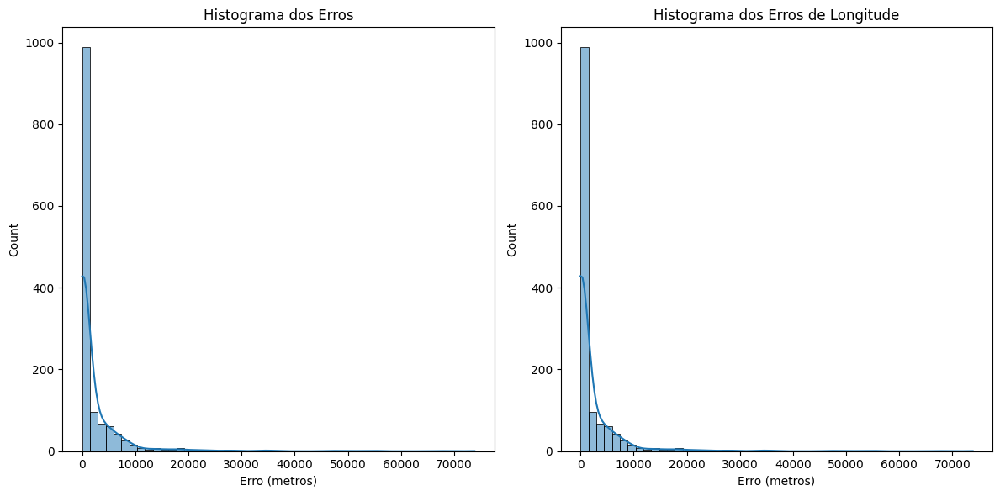

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(errors_lat, bins=50, kde=True)
plt.title('Histograma dos Erros')
plt.xlabel('Erro (metros)')

plt.subplot(1, 2, 2)
sns.histplot(errors_lon, bins=50, kde=True)
plt.title('Histograma dos Erros de Longitude')
plt.xlabel('Erro (metros)')

plt.tight_layout()
plt.show()

## Box-plot dos erros

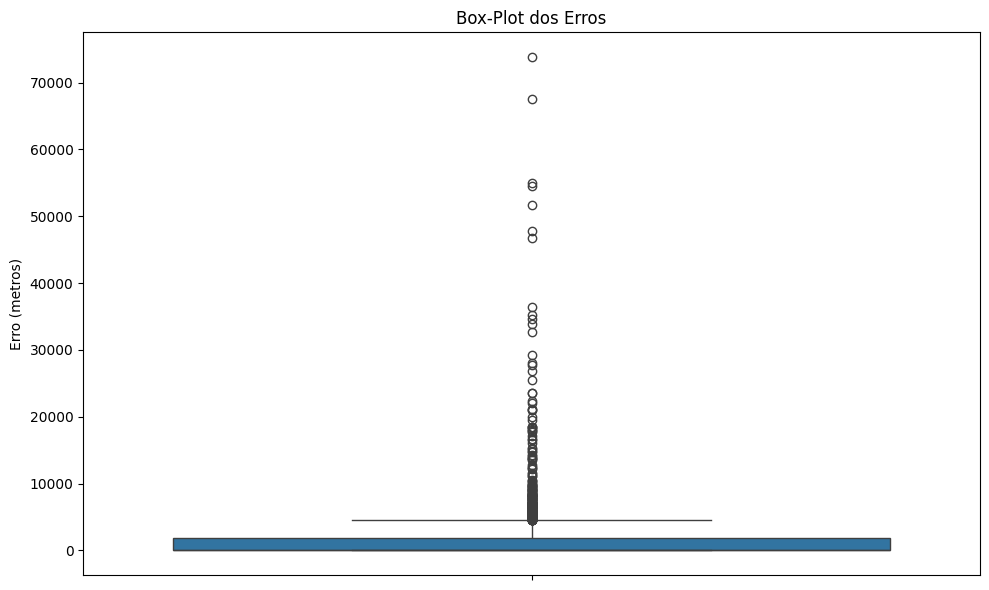

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lat)
plt.title('Box-Plot dos Erros')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()


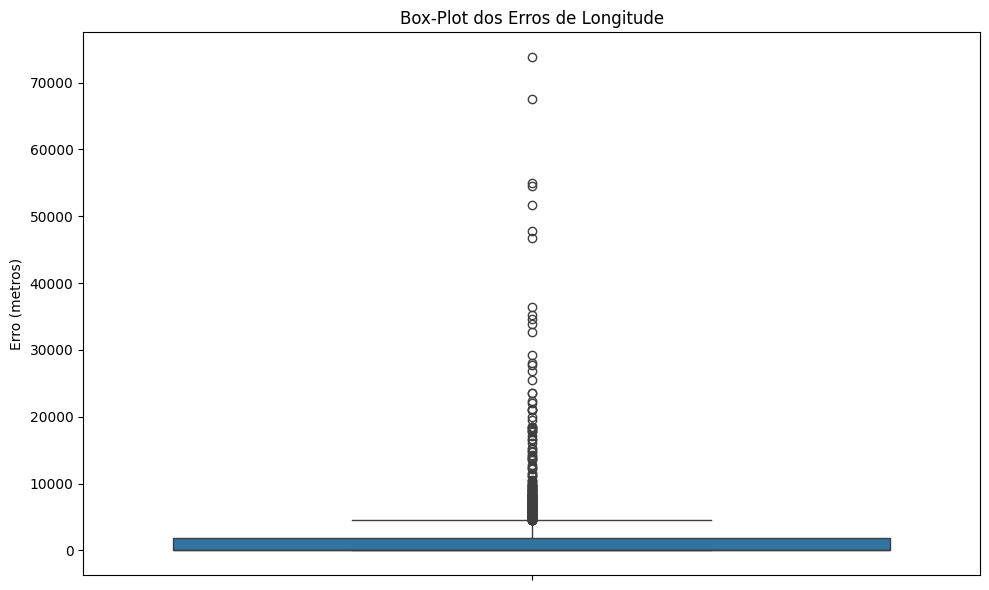

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lon)
plt.title('Box-Plot dos Erros de Longitude')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

## Estatísticas de erro (Erro Médio, Mínimo, Máximo e Desvio-Padrão)



Estatísticas de erro: latitude

In [172]:
errors = np.array(errors_lat)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")


Erro Médio: 6.53 metros
Erro Mínimo: 0.00 metros
Erro Máximo: 147.33 metros
Desvio-Padrão: 14.95 metros


Estatísticas de erro: longitude

In [166]:
errors = np.array(errors_lon)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")


Erro Médio: 20.51 metros
Erro Mínimo: 0.90 metros
Erro Máximo: 168.84 metros
Desvio-Padrão: 24.11 metros


## Porcentagem de erro dependendo de um threshold em metros


### MLP

In [ ]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, mlp_lat_final, mlp_lon_final)
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 0.00%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 100.00%


In [ ]:
errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, mlp_lat_final, mlp_lon_final)
print(f'Acurácia em metros para o MLP: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o MLP: 6345.40


### KNN

In [ ]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, knn_lat_final, knn_lon_final)
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 68.34%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 31.66%


In [ ]:
errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, knn_lat_final, knn_lon_final)
print(f'Acurácia em metros para o KNN: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o KNN: 2848.83


### XGB

In [ ]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, xgb_lat_final, xgb_lon_final)
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 39.85%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 60.15%


In [ ]:
errors_df_sorted = calculate_errors(X_test, y_test_lat, y_test_lon, xgb_lat_final, xgb_lon_final)
print(f'Acurácia em metros para o XGB: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o XGB: 2112.20


## Mapa de visualização do ponto com maior erro em metros

In [ ]:
# Valores reais vs previstos
index_to_test = int(errors_df_sorted.iloc[0]['Index'])

true_lat = y_test_lat[index_to_test]
true_lon = y_test_lon[index_to_test]
pred_lat = mlp_lat_final.predict([X_test[index_to_test]])[0]
pred_lon = mlp_lon_final.predict([X_test[index_to_test]])[0]
error = errors_df_sorted['Error'].min()

print(f"""
Latitude Real: {true_lat}
Longitude Real: {true_lon}
Latitude Predita: {pred_lat}
Longitude Predita: {pred_lon}
Erro (metros): {error}
""")


Latitude Real: 1.4877447076766857
Longitude Real: -3.34950412406927
Latitude Predita: 1.7494290130104115
Longitude Predita: -2.971164566856434
Erro (metros): 73832.62386537928



In [ ]:
# Criar o mapa centralizado no ponto com maior erro

y_test_lat_original = scaler_y_lat.inverse_transform(y_test_lat.reshape(-1, 1)).ravel()
y_test_lon_original = scaler_y_lon.inverse_transform(y_test_lon.reshape(-1, 1)).ravel()
y_pred_lat_final_original = scaler_y_lat.inverse_transform(y_pred_lat_final.reshape(-1, 1)).ravel()
y_pred_lon_final_original = scaler_y_lon.inverse_transform(y_pred_lon_final.reshape(-1, 1)).ravel()

true_lat = y_test_lat_original[0]
true_lon = y_test_lon_original[0]
pred_lat = y_pred_lat_final_original[0]
pred_lon = y_pred_lon_final_original[0]

map_center = [true_lat, true_lon]
map = folium.Map(location=map_center, zoom_start=50)

folium.Marker(
    location=[true_lat, true_lon],
    popup='Latitude Real: {:.6f}\nLongitude Real: {:.6f}'.format(true_lat, true_lon),
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(map)

folium.Marker(
    location=[pred_lat, pred_lon],
    popup='Latitude Predita: {:.6f}\nLongitude Predita: {:.6f}'.format(pred_lat, pred_lon),
    icon=folium.Icon(color='red', icon='info-sign')
).add_to(map)

folium.PolyLine(
    locations=[[true_lat, true_lon], [pred_lat, pred_lon]],
    color='green',
    weight=2.5,
    opacity=0.7
).add_to(map)

map

## Mapa de comparação: posições preditas vs. posições reais



In [ ]:
mapa = folium.Map(location=[np.mean(y_test_lat_original), np.mean(y_test_lon_original)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(y_test_lat_original, y_test_lon_original):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Adicionar marcadores para os pontos previstos (vermelho)
for lat, lon in zip(y_pred_lat_final_original, y_pred_lon_final_original):
    folium.CircleMarker(location=[lat, lon], radius=5, color='red', fill=True, fill_color='red', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa